# **train**

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
%pip install ultralytics
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.107 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.4/78.2 GB disk)


In [ ]:
import os
import shutil
import random
!pip install tqdm --upgrade
from tqdm.notebook import tqdm

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
!nvidia-smi

Fri May 19 12:38:33 2023       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.85.12    Driver Version: 525.85.12    CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla T4            Off  | 00000000:00:04.0 Off |                    0 |
| N/A   37C    P8     9W /  70W |      3MiB / 15360MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [ ]:
train_path_img = "./yolo_data/images/train/"
train_path_label = "./yolo_data/labels/train/"
val_path_img = "./yolo_data/images/val/"
val_path_label = "./yolo_data/labels/val/"
test_path = "./yolo_data/test"

In [ ]:
'''
Split the dataset into train and test and creates the train.txt and test.tx with
the respective path of the images in each folder

'''
import os
def train_test_split(path,neg_path=None, split = 0.2):
    print("------ PROCESS STARTED -------")


    files = list(set([name[:-4] for name in os.listdir(path)])) ## removing duplicate names i.e. counting only number of images


    print (f"--- This folder has a total number of {len(files)} images---")
    random.seed(42)
    random.shuffle(files)

    test_size = int(len(files) * split)
    train_size = len(files) - test_size

    ## creating required directories

    os.makedirs(train_path_img, exist_ok = True)
    os.makedirs(train_path_label, exist_ok = True)
    os.makedirs(val_path_img, exist_ok = True)
    os.makedirs(val_path_label, exist_ok = True)


    ### ----------- copying images to train folder
    for filex in tqdm(files[:train_size]):
      if filex == 'classes':
          continue
      shutil.copy2(path + filex + '.jpg',f"{train_path_img}/" + filex + '.jpg' )
      shutil.copy2(path + filex + '.txt', f"{train_path_label}/" + filex + '.txt')



    print(f"------ Training data created with 80% split {len(files[:train_size])} images -------")

    if neg_path:
        neg_images = list(set([name[:-4] for name in os.listdir(neg_path)])) ## removing duplicate names i.e. counting only number of images
        for filex in tqdm(neg_images):
            shutil.copy2(neg_path+filex+ ".jpg", f"{train_path_img}/" + filex + '.jpg')

        print(f"------ Total  {len(neg_images)} negative images added to the training data -------")

        print(f"------ TOTAL Training data created with {len(files[:train_size]) + len(neg_images)} images -------")



    ### copytin images to validation folder
    for filex in tqdm(files[train_size:]):
      if filex == 'classes':
          continue
      # print("running")
      shutil.copy2(path + filex + '.jpg', f"{val_path_img}/" + filex + '.jpg' )
      shutil.copy2(path + filex + '.txt', f"{val_path_label}/" + filex + '.txt')

    print(f"------ Testing data created with a total of {len(files[train_size:])} images ----------")

    print("------ TASK COMPLETED -------")

## spliting the data into train-test and creating train.txt and test.txt files
# train_test_split('/content/drive/MyDrive/custom_notebooks/yolo_data/')

### for label_tag
train_test_split('/content/drive/MyDrive/major_project_yolov8/data/obj_train_data/') ### without negative images
# train_test_split('./data/','./negative_images/') ### if you want to feed negative images

In [ ]:
import ultralytics
ultralytics.checks()

Ultralytics YOLOv8.0.107 🚀 Python-3.10.11 torch-2.0.1+cu118 CPU
Setup complete ✅ (2 CPUs, 12.7 GB RAM, 23.8/107.7 GB disk)


In [ ]:
from ultralytics import YOLO

# Load a model
model = YOLO('yolov8s.yaml')  # build a new model from YAML

# Train the model
model.train(data='/content/drive/MyDrive/major_project_yolov8/dataset.yaml', epochs=100, imgsz=640, project='/content/drive/MyDrive/major_project_yolov8/training_result', name='newspaper')

# # Save the training result
# model.save()


                   from  n    params  module                                       arguments                     
  0                  -1  1       928  ultralytics.nn.modules.conv.Conv             [3, 32, 3, 2]                 
  1                  -1  1     18560  ultralytics.nn.modules.conv.Conv             [32, 64, 3, 2]                
  2                  -1  1     29056  ultralytics.nn.modules.block.C2f             [64, 64, 1, True]             
  3                  -1  1     73984  ultralytics.nn.modules.conv.Conv             [64, 128, 3, 2]               
  4                  -1  2    197632  ultralytics.nn.modules.block.C2f             [128, 128, 2, True]           
  5                  -1  1    295424  ultralytics.nn.modules.conv.Conv             [128, 256, 3, 2]              
  6                  -1  2    788480  ultralytics.nn.modules.block.C2f             [256, 256, 2, True]           
  7                  -1  1   1180672  ultralytics.nn.modules.conv.Conv             [256

In [ ]:
tensorboard --logdir /content/drive/MyDrive/major_project_yolov8/training_result/newspaper3

# **test**

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt conf=0.5 source=/content/drive/MyDrive/major_project_yolov8/test_image

Ultralytics YOLOv8.0.107 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3006428 parameters, 0 gradients

image 1/50 /content/drive/MyDrive/major_project_yolov8/test_image/20230520_181012.jpg: 640x384 1 body, 54.6ms
image 2/50 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145346.jpg: 640x480 2 heading subs, 1 heading, 6 bodys, 51.0ms
image 3/50 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145454.jpg: 640x480 3 heading subs, 9 bodys, 3 imagess, 6.7ms
image 4/50 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg: 640x576 4 heading subs, 10 bodys, 2 imagess, 51.7ms
image 5/50 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145655.jpg: 640x448 3 heading subs, 9 bodys, 3 imagess, 50.8ms
image 6/50 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145714.jpg: 544x640 2 heading subs, 5 bodys, 2 imagess, 54.3ms
image 7/50 /content/drive/MyDrive/major_pr

In [ ]:
!yolo task=detect mode=predict model=/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt conf=0.5 source=/content/drive/MyDrive/major_project_yolov8/test_video_3

Ultralytics YOLOv8.0.107 🚀 Python-3.10.11 torch-2.0.1+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8n summary (fused): 168 layers, 3006428 parameters, 0 gradients

video 1/1 (1/443) /content/drive/MyDrive/major_project_yolov8/test_video_3/IMG_6384.MOV: 640x384 6 heading subs, 27 bodys, 2 imagess, 82.6ms
video 1/1 (2/443) /content/drive/MyDrive/major_project_yolov8/test_video_3/IMG_6384.MOV: 640x384 7 heading subs, 31 bodys, 2 imagess, 10.5ms
video 1/1 (3/443) /content/drive/MyDrive/major_project_yolov8/test_video_3/IMG_6384.MOV: 640x384 5 heading subs, 28 bodys, 1 images, 20.0ms
video 1/1 (4/443) /content/drive/MyDrive/major_project_yolov8/test_video_3/IMG_6384.MOV: 640x384 7 heading subs, 25 bodys, 3 imagess, 23.0ms
video 1/1 (5/443) /content/drive/MyDrive/major_project_yolov8/test_video_3/IMG_6384.MOV: 640x384 7 heading subs, 30 bodys, 3 imagess, 14.0ms
video 1/1 (6/443) /content/drive/MyDrive/major_project_yolov8/test_video_3/IMG_6384.MOV: 640x384 6 heading subs, 27 bodys, 3 imagess, 8.5m

In [ ]:
import locale
def getpreferredencoding(do_setlocale = True):
    return "UTF-8"
locale.getpreferredencoding = getpreferredencoding

# **READING ORDER along with image to text then text to audio**

In [ ]:
from ultralytics import YOLO
from ultralytics.yolo.utils.plotting import Annotator

# Load a model

model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')  # load a pretrained model (recommended for training)


results = model('/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg',conf=0.5)  # predict on an image
# boxes.data
# boxes.xyxy[0]  # get box coordinates in (top, left, bottom, right) format
boxes.cls
# annotator.box_label(b, model.names[int(c)])
for box in boxes:

            b = box.xyxy[0]  # get box coordinates in (top, left, bottom, right) format
            c = box.cls
            d=(b, model.names[int(c)])


print(d)



image 1/1 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg: 640x576 4 heading subs, 10 bodys, 2 imagess, 541.7ms
Speed: 12.0ms preprocess, 541.7ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


(array([          0,       629.6,      515.23,      1045.5], dtype=float32), 'body')


In [ ]:
from ultralytics import YOLO
import cv2

model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')  # load a pretrained model (recommended for training)

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'

results = model(image_path,conf=0.5)
img = cv2.imread(image_path)
for result in results:
    boxes = result.boxes.cpu().numpy()
    for i, box in enumerate(boxes):
        r = box.xyxy[0].astype(int)
        crop = img[r[1]:r[3], r[0]:r[2]]
        cv2.imwrite(str(i) + ".jpg", crop)



image 1/1 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg: 640x576 4 heading subs, 10 bodys, 2 imagess, 281.3ms
Speed: 8.5ms preprocess, 281.3ms inference, 1.4ms postprocess per image at shape (1, 3, 640, 640)


In [ ]:
import cv2
import numpy as np
from collections import deque
from operator import attrgetter

class BoundingBox:
    def __init__(self, x, y, w, h, label):
        self.x = x
        self.y = y
        self.w = w
        self.h = h
        self.label = label

class Node:
    def __init__(self, bounding_box):
        self.bounding_box = bounding_box
        self.children = []

def sort_boxes(boxes):
    return sorted(boxes, key=lambda box: (box.y, box.x))

def add_child(parent, child):
    parent.children.append(child)

def pre_order_traversal(node):
    if not node:
        return []
    result = [node.bounding_box]
    for child in node.children:
        result.extend(pre_order_traversal(child))
    return result

def process_image(image_path, yolo_model):
    # Load image and run YOLOv8 model
    image = cv2.imread(image_path)
    boxes = run_yolo_v8(image, yolo_model)

    # Separate and sort bounding boxes
    headings = sort_boxes([box for box in boxes if box.label == 'heading'])
    other_boxes = sort_boxes([box for box in boxes if box.label != 'heading'])

    # Create n-ary tree with heading bounding boxes as root nodes
    root_nodes = [Node(heading) for heading in headings]

    # Assign other bounding boxes to their respective headings
    for box in other_boxes:
        for root in root_nodes:
            if box.y > root.bounding_box.y:
                add_child(root, Node(box))
                break

    # Pre-order traversal to get the final order of bounding boxes
    ordered_boxes = []
    for root in root_nodes:
        ordered_boxes.extend(pre_order_traversal(root))

    return ordered_boxes

def run_yolo_v8(image, yolo_model):
    # Implement YOLOv8 model inference here
    # Return a list of BoundingBox objects
    pass

# Load YOLOv8 model
yolo_model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

# Process image
image_path = 'path/to/your/image.jpg'
ordered_boxes = process_image(image_path, yolo_model)

# Display ordered bounding boxes
for box in ordered_boxes:
    print(f"Label: {box.label}, X: {box.x}, Y: {box.y}, W: {box.w}, H: {box.h}")

In [ ]:
import cv2
import torch
import torchvision.transforms as T
from collections import deque
from operator import attrgetter

class BoundingBox:
    def __init__(self, x, y, w, h, label):
        self.x = x
        self.y = y
        self.w = w
        self.h = h
        self.label = label

class Node:
    def __init__(self, bounding_box):
        self.bounding_box = bounding_box
        self.children = []

def sort_boxes(boxes):
    return sorted(boxes, key=lambda box: (box.y, box.x))

def add_child(parent, child):
    parent.children.append(child)

def pre_order_traversal(node):
    if not node:
        return []
    result = [node.bounding_box]
    for child in node.children:
        result.extend(pre_order_traversal(child))
    return result

def load_yolo_v8_model(model_path):
    model = torch.load(model_path)
    model.eval()
    return model

def run_yolo_v8(image, yolo_model):
    # Preprocess the input image
    transform = T.Compose([
        T.Resize((416, 416)),
        T.ToTensor(),
        T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224,0.225]),
    ])
    input_tensor = transform(image).unsqueeze(0)

    # Perform inference with the YOLOv8 model
    with torch.no_grad():
        output = yolo_model(input_tensor)

    # Post-process the output to extract bounding boxes
    boxes = post_process_output(output)

    return boxes

def post_process_output(output):
    # Implement the post-processing logic to extract bounding boxes
    # from the model output and return a list of BoundingBox objects
    pass

def process_image(image_path, yolo_model):
    # Load image and run YOLOv8 model
    image = cv2.imread(image_path)
    boxes = run_yolo_v8(image, yolo_model)

    # Separate and sort bounding boxes
    headings = sort_boxes([box for box in boxes if box.label == 'heading'])
    other_boxes = sort_boxes([box for box in boxes if box.label != 'heading'])

    # Create n-ary tree with heading bounding boxes as root nodes
    root_nodes = [Node(heading) for heading in headings]

    # Assign other bounding boxes to their respective headings
    for box in other_boxes:
        for root in root_nodes:
            if box.y > root.bounding_box.y:
                add_child(root, Node(box))
                break

    # Pre-order traversal to get the final order of bounding boxes
    ordered_boxes = []
    for root in root_nodes:
        ordered_boxes.extend(pre_order_traversal(root))

    return ordered_boxes

# Load YOLOv8 model
yolo_model = load_yolo_v8_model('path/to/your/yolov8_model.pth')

# Process image
image_path = 'path/to/your/image.jpg'
ordered_boxes = process_image(image_path, yolo_model)

# Display ordered bounding boxes
for box in ordered_boxes:
    print(f"Label: {box.label}, X: {box.x}, Y: {box.y}, W: {box.w}, H: {box.h}")

In [ ]:
for r in results:

        annotator = Annotator(frame)

        boxes = r.boxes
        for box in boxes:

            b = box.xyxy[0]  # get box coordinates in (top, left, bottom, right) format
            c = box.cls
            annotator.box_label(b, model.names[int(c)])

annotator.result()

In [ ]:
import cv2
import pytesseract
from PIL import Image
from IPython.display import display

# Set the path to the Tesseract executable
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'

# Load the YOLO model
model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'

# Perform object detection
results = model(image_path, conf=0.5)
img = cv2.imread(image_path)

# Loop through the extracted bounding boxes and perform OCR
for i, boxz in box.xyxy[0]:
    boxes = boxz.tolist()
    for j, boxz in enumerate(boxes):
        x1, y1, x2, y2 = boxz[:4]
        x1, y1, x2, y2 = int(x1), int(y1), int(x2), int(y2)
        crop = img[y1:y2, x1:x2]
    #     for boxz in box.xyxy[0]:
    # bbox = boxz.tolist()
    # class_index = int(box.cls)
    # class_label = model.names[class_index]
    # annotation = (bbox, class_label)

        # Convert the cropped image to PIL Image
        pil_image = Image.fromarray(cv2.cvtColor(crop, cv2.COLOR_BGR2RGB))

        # Perform OCR on the cropped image
        extracted_text = pytesseract.image_to_string(pil_image)

        # Display the cropped image and extracted text
        display(pil_image)
        print(f"Text from image {i+1}, boxz {j+1}:")
        print(extracted_text)
        print()


    # for i, box in enumerate(boxes):
    #     r = box.xyxy[0].astype(int)
    #     crop = img[r[1]:r[3], r[0]:r[2]]
    #     cv2.imwrite(str(i) + ".jpg", crop)




0: 640x576 5 heading subs, 1 heading, 11 bodys, 2 imagess, 187.5ms
Speed: 6.5ms preprocess, 187.5ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 640)


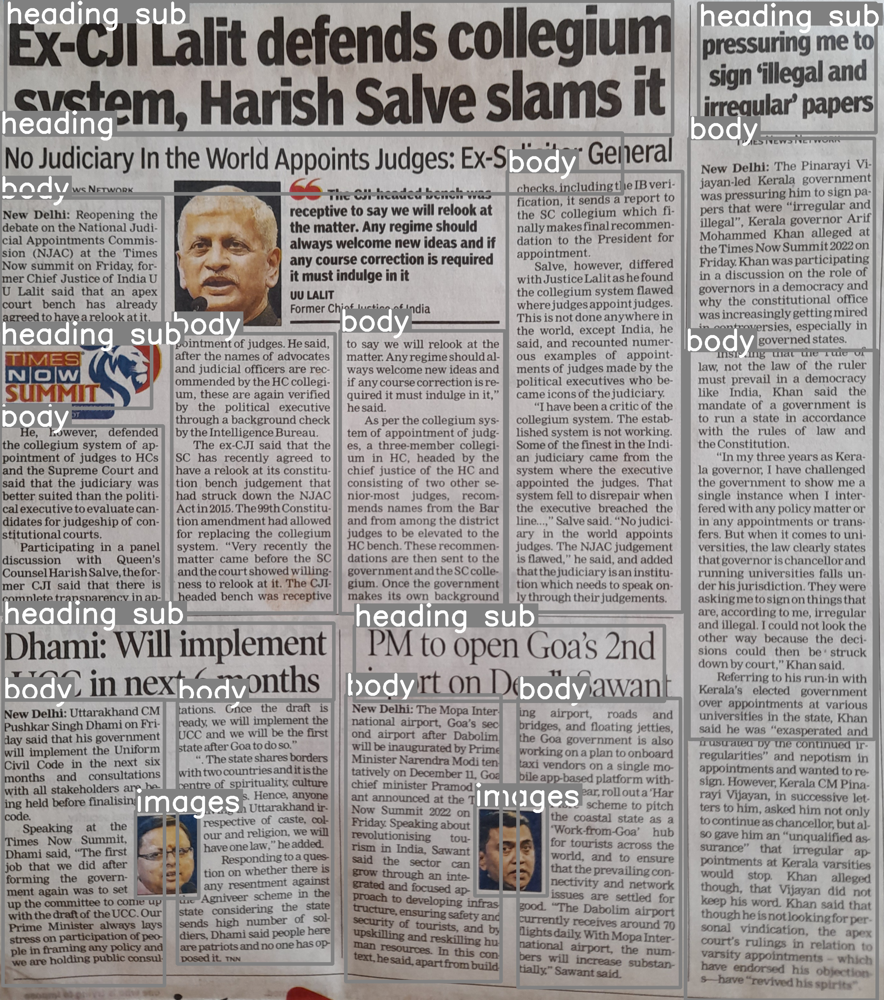

In [ ]:
from ultralytics import YOLO
import cv2
from ultralytics.yolo.utils.plotting import Annotator
from google.colab.patches import cv2_imshow

model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'
# Read the image
image = cv2.imread(image_path)

# Convert the image to RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Predict bounding boxes
results = model.predict(image)

# Create an annotator object
annotator = Annotator(image)

# Process each bounding box and draw on the image
for r in results:
    boxes = r.boxes
    for box in boxes:
        b = box.xyxy[0]  # get box coordinates in (top, left, bottom, right) format
        c = box.cls
        annotator.box_label(b, model.names[int(c)])

# Get the annotated image
annotated_image = annotator.result()

# Convert the image back to BGR for displaying with OpenCV
annotated_image = cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR)

# Display the annotated image using cv2_imshow() in Google Colab
cv2_imshow(annotated_image)


In [ ]:
from ultralytics import YOLO
import cv2
import pytesseract
from PIL import Image
from ultralytics.yolo.utils.plotting import Annotator
from google.colab.patches import cv2_imshow

# Set the path to the Tesseract executable (change it according to your system)
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'

model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'

# Read the image
image = cv2.imread(image_path)

# Convert the image to RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Predict bounding boxes
results = model.predict(image)

# Create an annotator object
annotator = Annotator(image)

# Process each bounding box and draw on the image
for r in results:
    boxes = r.boxes
    for box in boxes:
        b = box.xyxy[0]  # get box coordinates in (top, left, bottom, right) format
        c = box.cls
        annotator.box_label(b, model.names[int(c)])

        # Extract the text inside the box using OCR
        box_image = Image.fromarray(image[b[1]:b[3], b[0]:b[2]])
        text = pytesseract.image_to_string(box_image)
        print(f"Text: {text}")

# Get the annotated image
annotated_image = annotator.result()

# Convert the image back to BGR for displaying with OpenCV
annotated_image = cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR)

# Display the annotated image using cv2_imshow() in Google Colab
cv2_imshow(annotated_image)


In [ ]:
!pip install pytesseract
!sudo apt-get install tesseract-ocr


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2build2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


In [ ]:
import cv2
import torch
from PIL import Image
import pytesseract
from ultralytics import YOLO
from ultralytics.yolo.utils.plotting import Annotator

# Load the YOLO model

model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'


# Load the image
image = cv2.imread(image_path)

# Check if the image was successfully loaded
if image is None:
    raise ValueError("Failed to load image: {}".format(image_path))

# Get the input size for the YOLOv8 model
input_size = model.model.module.stride[0] * 32 if hasattr(model.model, 'module') else model.model.stride[0] * 32

# Resize the image using OpenCV
resized_image = cv2.resize(image, (input_size, input_size))

# Convert the resized image to RGB
resized_image_rgb = cv2.cvtColor(resized_image, cv2.COLOR_BGR2RGB)

# Convert the resized image to a tensor
image_tensor = torch.from_numpy(resized_image_rgb.transpose((2, 0, 1))).float().div(255.0)

# Add a batch dimension to the tensor
image_tensor = image_tensor.unsqueeze(0)

# Predict bounding boxes
results = model.predict(image_tensor)

# Create an annotator object
annotator = Annotator(image)

# Loop through the extracted bounding boxes and perform OCR
for box in boxes:
    b = box.xyxy[0].int()  # convert box coordinates to integers
    c = box.cls

    # Draw the bounding box on the image
    annotator.box_label(b, model.names[int(c)])

    # Extract the text inside the box using OCR
    box_image = Image.fromarray(resized_image_rgb[b[1]:b[3], b[0]:b[2]])
    text = pytesseract.image_to_string(box_image)
    print(f"Text: {text}")

# Get the annotated image
annotated_image = annotator.result()

# Convert the image back to BGR for displaying with OpenCV
annotated_image = cv2.cvtColor(annotated_image, cv2.COLOR_RGB2BGR)

# Display the annotated image
cv2.imshow('YOLO V8 Detection', annotated_image)
cv2.waitKey(0)
cv2.destroyAllWindows()


In [ ]:
# !pip install pytesseract
# !apt install tesseract-ocr

import pytesseract
from PIL import Image
import os

# Set the path to the Tesseract executable
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'

# Folder path containing the images
folder_path = '/content/'

# Get the list of image files in the folder
image_files = [f for f in os.listdir(folder_path) if os.path.isfile(os.path.join(folder_path, f))]

for image_file in image_files:
    # Construct the full file path
    file_path = os.path.join(folder_path, image_file)

    # Load the image
    image = Image.open(file_path)

    # Preprocess the image if needed

    # Perform OCR
    text = pytesseract.image_to_string(image)

    # Print or process the extracted text
    print(f"Text in {image_file}:")
    print(text)
    print('---')


Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2build2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.
Text in 8.jpg:
New Delhi: Uttarakhand CM
Pushkar Singh Dhami on Fri-
day said that his government
will implement the Uniform
Civil Code in the next six
months and consultations
with all stakeholders are be-
ing held before finalising the
code.
at the
Times Now Summit,
Dhami said, “The first
job that we did after
forming the govern-
ment again was to set
up the committee to come up
with the draft of the UCC. Our
Prime Minister always lays
stress on participation of peo-
ple in framing any policy and
_we are holding public consul

=
EEE

 

---
Text in 9.jpg:
ing airport, roads and
bridges, and floating jetties,
the Goa government is also
working on a plan to onboard
axi v

UnidentifiedImageError: ignored

In [ ]:
# !pip install pytesseract
# !apt install tesseract-ocr
from ultralytics import YOLO
import cv2
import pytesseract
from PIL import Image


pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'


model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'


results = model(image_path, conf=0.5)

img = cv2.imread(image_path)
for result in results:
    boxes = result.boxes.cpu().numpy()
    for i, box in enumerate(boxes):
        r = box.xyxy[0].astype(int)
        crop = img[r[1]:r[3], r[0]:r[2]]
        cv2.imwrite(str(i) + ".jpg", crop)

        cropped_image = Image.fromarray(crop)
        text = pytesseract.image_to_string(cropped_image)
        print(f"Text in {str(i)}.jpg:")
        print(text)
        print('---')



image 1/1 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg: 640x576 4 heading subs, 10 bodys, 2 imagess, 271.1ms
Speed: 5.7ms preprocess, 271.1ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


Text in 0.jpg:
 

Ex-CIl Lalit defends collegium
system, Harish Salve slams it

---
Text in 1.jpg:
to say we will relook at the
matter. Any regime should al-
ways welcome new ideas and
if any course correction is re-
quired it must indulge in it,”
he said.

As per the collegium sys-
tem of appointment of judg-
es, a three-member collegi-
um in HC, headed by the
chief justice of the HC and
consisting of two other se-
nior-most judges, recom-
mends names from the Bar
and from among the district
judges to be elevated to the
HC bench. These recommen-
dations are then sent to the
government and the SC colle-
gium. Once the government
makes its own background

---
Text in 2.jpg:
pointment of judges. He said,
after the names of advocates
and judicial officers are rec-
ommended by the HC collegi-
um, these are again verified
by the political executive
through a background check
by the Intelligence Bureau.
The ex-CJI said that the
SC has recently agreed to
have a relook at its constitu-
tion 

In [ ]:
from ultralytics import YOLO
import cv2
import pytesseract
from PIL import Image

# Set the path to the Tesseract executable
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'

# Load the YOLO model
model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'

# Run object detection
results = model(image_path, conf=0.5)

img = cv2.imread(image_path)
cropped_images = []
cropped_boxes = []

for result in results:
    boxes = result.boxes.cpu().numpy()
    for i, box in enumerate(boxes):
        r = box.xyxy[0].astype(int)
        crop = img[r[1]:r[3], r[0]:r[2]]
        cropped_images.append(crop)
        cropped_boxes.append(box)

# Process the detections directly without sorting
for i, crop in enumerate(cropped_images):
    box = cropped_boxes[i]

    # Perform OCR on the cropped image
    cropped_image = Image.fromarray(crop)
    text = pytesseract.image_to_string(cropped_image)

    print(f"Text in box {i}:")
    print(text)
    print('---')




image 1/1 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg: 640x576 4 heading subs, 10 bodys, 2 imagess, 196.0ms
Speed: 5.9ms preprocess, 196.0ms inference, 1.0ms postprocess per image at shape (1, 3, 640, 640)


Text in box 0:
 

Ex-CIl Lalit defends collegium
system, Harish Salve slams it

---
Text in box 1:
to say we will relook at the
matter. Any regime should al-
ways welcome new ideas and
if any course correction is re-
quired it must indulge in it,”
he said.

As per the collegium sys-
tem of appointment of judg-
es, a three-member collegi-
um in HC, headed by the
chief justice of the HC and
consisting of two other se-
nior-most judges, recom-
mends names from the Bar
and from among the district
judges to be elevated to the
HC bench. These recommen-
dations are then sent to the
government and the SC colle-
gium. Once the government
makes its own background

---
Text in box 2:
pointment of judges. He said,
after the names of advocates
and judicial officers are rec-
ommended by the HC collegi-
um, these are again verified
by the political executive
through a background check
by the Intelligence Bureau.
The ex-CJI said that the
SC has recently agreed to
have a relook at its constitu-
tion 

In [ ]:
!pip install gTTS
from ultralytics import YOLO
import cv2
import pytesseract
from gtts import gTTS
import os

# Set the path to the Tesseract executable
pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'

# Load the YOLO model
model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'

# Run object detection
results = model(image_path, conf=0.5)

img = cv2.imread(image_path)
cropped_images = []
cropped_boxes = []
text_results = []

for result in results:
    boxes = result.boxes.cpu().numpy()
    for i, box in enumerate(boxes):
        r = box.xyxy[0].astype(int)
        crop = img[r[1]:r[3], r[0]:r[2]]
        cropped_images.append(crop)
        cropped_boxes.append(box)

# Process the detections directly without sorting
for i, crop in enumerate(cropped_images):
    box = cropped_boxes[i]

    # Perform OCR on the cropped image
    cropped_image = Image.fromarray(crop)
    text = pytesseract.image_to_string(cropped_image)
    text_results.append(text)

    print(f"Text in box {i}:")
    print(text)
    print('---')

# Convert text to speech and save as an audio file
output_dir = '/content/drive/MyDrive/major_project_yolov8/audio_output/'
os.makedirs(output_dir, exist_ok=True)

for i, text in enumerate(text_results):
    tts = gTTS(text=text, lang='en')
    audio_file_path = os.path.join(output_dir, f"audio_{i}.mp3")
    tts.save(audio_file_path)
    print(f"Audio file saved: {audio_file_path}")


In [ ]:
from ultralytics import YOLO
import cv2
import pytesseract
from PIL import Image
from gtts import gTTS
import os
import numpy as np
from operator import attrgetter


pytesseract.pytesseract.tesseract_cmd = '/usr/bin/tesseract'


model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'


results = model(image_path, conf=0.5)

img = cv2.imread(image_path)
cropped_images = []
cropped_boxes = []
text_results = []

for result in results:
    boxes = result.boxes.xyxy
    confidence = result.boxes.conf

    filtered_boxes = [box for box, conf in zip(boxes, confidence) if conf > 0.5]
    sorted_boxes = sorted(filtered_boxes, key=lambda b: b[0])

    for i, box in enumerate(sorted_boxes):
        r = box.int().tolist()
        crop = img[r[1]:r[3], r[0]:r[2]]
        cropped_images.append(crop)
        cropped_boxes.append(box)


for i, crop in enumerate(cropped_images):
    box = cropped_boxes[i]


    cropped_image = Image.fromarray(crop)
    text = pytesseract.image_to_string(cropped_image)
    text_results.append(text)

    print(f"Text in box {i}:")
    print(text)
    print('---')


output_dir = '/content/drive/MyDrive/major_project_yolov8/audio_output/'
os.makedirs(output_dir, exist_ok=True)

for i, text in enumerate(text_results):
    if text.strip():
        tts = gTTS(text=text, lang='en')
        audio_file_path = os.path.join(output_dir, f"audio_{i}.mp3")
        tts.save(audio_file_path)
        print(f"Audio file saved: {audio_file_path}")
    else:
        print(f"No text found in box {i}. Skipping audio conversion.")



image 1/1 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg: 640x576 4 heading subs, 10 bodys, 2 imagess, 52.8ms
Speed: 4.6ms preprocess, 52.8ms inference, 2.0ms postprocess per image at shape (1, 3, 640, 640)


Text in box 0:
He, however, defended
the collegium system of ap-
pointment of judges to HCs
and the Supreme Court and
said that the judiciary was
better suited than the politi-
cal executive to evaluate can-
didates for judgeship of con-
stitutional courts.

Participating in a panel
discussion with Queen’s
Counsel Harish Salve, the for-
mer CJI said that there is
complete transparency in ap-

---
Text in box 1:
New Delhi: Reopening the
debate on the National Judi-
cial Appointments Commis-
sion (NJAC) at the Times
Now summit on Friday, for-
mer Chief Justice of India U
U Lalit said that an apex
court bench has already
agreed to have arelook at it.

---
Text in box 2:
Dhami: Will implement
UCC in next 6 months

---
Text in box 3:
New Delhi: Uttarakhand CM
Pushkar Singh Dhami on Fri-
day said that his government
will implement the Uniform
Civil Code in the next six
months and consultations
with all stakeholders are be-
ing held before finalising the
code.

at the
Times Now Summit,
Dha

In [ ]:
!pip install gTTS
!pip install pytesseract
!apt install tesseract-ocr

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
Reading package lists... Done
Building dependency tree       
Reading state information... Done
tesseract-ocr is already the newest version (4.1.1-2build2).
0 upgraded, 0 newly installed, 0 to remove and 24 not upgraded.


# **simple code to read newspaper with all the steps**

In [ ]:
import cv2
import numpy as np

import pytesseract
from pytesseract import Output

class BoundingBox:
    def __init__(self, xyxy, cls):
        self.xyxy = xyxy
        self.cls = cls

class Node:
    def __init__(self, bounding_box):
        self.bounding_box = bounding_box
        self.children = []

def sort_boxes(boxes):
    return sorted(boxes, key=lambda box: box.xyxy[1])

def add_child(parent, child):
    parent.children.append(child)

def pre_order_traversal(node):
    if not node:
        return []
    result = [node.bounding_box]
    for child in node.children:
        result.extend(pre_order_traversal(child))
    return result


model = YOLO('/content/drive/MyDrive/major_project_yolov8/training_result/newspaper3/weights/best.pt')

image_path = '/content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg'


results = model(image_path)


boxes = [BoundingBox(box.xyxy, box.cls) for result in results for box in result.boxes]


headings = [box for box in boxes if box.cls == 'heading']


sorted_headings = sort_boxes(headings)


root_nodes = [Node(heading) for heading in sorted_headings]


for box in boxes:
    if box.cls != 'heading':
        for root in root_nodes:
            if box.xyxy[1] > root.bounding_box.xyxy[1]:
                add_child(root, Node(box))
                break


for root in root_nodes:
    sorted_boxes = sort_boxes(root.children)
    root.children = sorted_boxes


for root in root_nodes:
    for child in root.children:
        if child.bounding_box.cls == 'images':
            images = child.bounding_box
            for image in child.children:
                if image.bounding_box.cls == 'image':
                    add_child(images, image)


ordered_boxes = []
for root in root_nodes:
    ordered_boxes.extend(pre_order_traversal(root))


for box in ordered_boxes:
    xyxy = box.xyxy
    cls = box.cls
    x1, y1, x2, y2 = xyxy
    print(f"Box: ({x1}, {y1}, {x2}, {y2}), Class: {cls}")


custom_config = r'--oem 3 --psm 6'


for box in ordered_boxes:
    xyxy = box.xyxy
    cls = box.cls
    x1, y1, x2, y2 = xyxy


    crop = img[y1:y2, x1:x2]

    # Preprocess the cropped image if necessary (e.g., resizing, thresholding, etc.)
    # crop = preprocess(crop)

    # Apply OCR on the cropped region
    text = pytesseract.image_to_string(crop, config=custom_config)

    # Print the extracted text along with the class
    print(f"Class: {cls}, Text: {text}")



image 1/1 /content/drive/MyDrive/major_project_yolov8/test_image/20230521_145624.jpg: 640x576 4 heading subs, 1 heading, 11 bodys, 2 imagess, 306.4ms
Speed: 5.7ms preprocess, 306.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)
